# Try computing an independent priming probability plot for each timepoint 
- Spike in lymphoid for CS10-11
# current Solve for fate probabilities towards all terminal states
- use a cricular projection of the data
- try subsetting by stage at end

# We try using a background organ-state to increase the resolution of rarelineages

# Solve for Clara etal

In [1]:
import sys
import subprocess

%matplotlib inline
from collections import Counter
from collections import defaultdict
import scanpy as sc
import pandas as pd
import pickle as pkl
import numpy as np
import scipy
import matplotlib.pyplot as plt
import re
import glob
import os
import sys
from numpy import cov
import scipy.cluster.hierarchy as spc
import seaborn as sns; sns.set(color_codes=True)
from sklearn.linear_model import LogisticRegression
import sklearn
from pathlib import Path
from matplotlib import rcParams
rcParams['figure.figsize'] = 10,60

import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [4]:
adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_030522_notebooks/Submission_figure_scripts/F3/HSPC_comparison_dotplots/transition_state_prob_overtime_ipsc/Clara_IPSC/scvi_outs_terminal_states/run_A2_V9_IPSC_HM_Haem_traj_scvi_norm_.h5ad')

In [24]:
adata.obs['cell_labels_lvl_lineage'] = adata.obs['cell_labels_lvl_mixed'].astype(str).copy()
mix = ['AEC',
 'AdvancedMesoderm',
 'CMP',
 'Eo_Baso_Mast_precursor',
 'Erythroid',
 'Embryonic_Erythroid',
 'Fibroblast',
 'HE',
 'HSPC_1',
 'HSPC_2',
 'ILC_precursor',
 'Immature_B_cell',
 'Immature_EC',
 'Kupffer_cell_1',
 'Kupffer_cell_2',
 'LMPP',
 'Lymphoid_progenitor',
 'MEMP',
 'MK',
 'MOP',
 'Macrophage',
 'Mast_cell',
 'Mesothelium',
 'Monocyte_0',
 'NK',
 'Prolif_Sinusoidal_EC',
 'Sinusoidal_EC',
 'Smooth_Muscle',
 'VWF_EC','Lymphoid',]

lin = ['AEC',
 'AdvancedMesoderm',
 'CMP',
 'Eo_Baso_Mast_precursor',
 'Erythroid',
 'Embryonic_Erythroid',
 'Fibroblast',
 'HE',
 'HSPC_1',
 'HSPC_2',
 'ILC_precursor',
 'Immature_B_cell',
 'Immature_EC',
 'Kupffer_cell_1',
 'Kupffer_cell_2',
 'LMPP',
 'Lymphoid_progenitor',
 'MEMP',
 'MK',
 'MOP',
 'Macrophage',
 'Mast_cell',
 'Mesothelium',
 'Monocyte_0',
 'NK',
 'Prolif_Sinusoidal_EC',
 'Sinusoidal_EC',
 'Smooth_Muscle',
 'VWF_EC',
'Lymphoid',
]

mapper = dict(zip(mix,lin))
adata.obs['cell_labels_lvl_lineage'] = adata.obs['cell_labels_lvl_lineage'].map(mapper)
adata.obs['cell_labels_lvl_lineage'] = adata.obs['cell_labels_lvl_lineage'].astype('category')

In [25]:
adata.obs['cell_labels_lvl_lineage']

F61_Liver_CD45+_FCAImmP7862084_AAACCTGTCTAACGGT-0       Macrophage
F61_Liver_CD45+_FCAImmP7862084_AAACGGGCACAGGAGT-0       Macrophage
F61_Liver_CD45+_FCAImmP7862084_AAACGGGGTGATGTCT-0       Macrophage
F61_Liver_CD45+_FCAImmP7862084_AAACGGGTCGCCAAAT-0               MK
F61_Liver_CD45+_FCAImmP7862084_AAAGATGAGAGCTATA-0       Macrophage
                                                         ...      
TTTGGTTGTTCATCGA-3-1-1                                 Immature_EC
TTTGGTTTCAGCGGAA-3-1-1                                   Erythroid
TTTGTTGGTAACACGG-3-1-1                               Sinusoidal_EC
TTTGTTGGTTGAAGTA-3-1-1                                  Fibroblast
TTTGTTGTCCCTCGTA-3-1-1                                         AEC
Name: cell_labels_lvl_lineage, Length: 17238, dtype: category
Categories (25, object): ['AEC', 'AdvancedMesoderm', 'CMP', 'Embryonic_Erythroid', ..., 'Prolif_Sinusoidal_EC', 'Sinusoidal_EC', 'Smooth_Muscle', 'VWF_EC']

# Differentiate terminal states

In [26]:
adata.obs.loc[(adata.obs['dataset_merge'].isin(['EL'])) &  (adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid','Macrophage','Embryonic_Erythroid','Erythroid','MK'])),'cell_labels_lvl_lineage'].unique()

['Macrophage', 'MK', 'Erythroid', 'Lymphoid', 'Embryonic_Erythroid']
Categories (25, object): ['AEC', 'AdvancedMesoderm', 'CMP', 'Embryonic_Erythroid', ..., 'Prolif_Sinusoidal_EC', 'Sinusoidal_EC', 'Smooth_Muscle', 'VWF_EC']

In [28]:
adata.obs['cell_labels_lvl_lineage'] = adata.obs['cell_labels_lvl_lineage'].astype(str)
adata.obs.loc[(adata.obs['dataset_merge'].isin(['EL'])) &  (adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid','Macrophage','Embryonic_Erythroid','Erythroid','MK'])),'cell_labels_lvl_lineage'] =adata.obs.loc[(adata.obs['dataset_merge'].isin(['EL'])) &  (adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid','Macrophage','Embryonic_Erythroid','Erythroid','MK'])),'cell_labels_lvl_lineage'].astype(str)+'_terminal'
#data.obs['cell_labels_lvl_lineage'] = adata.obs['cell_labels_lvl_lineage'].str.replace('Embryonic_','')
adata.obs['cell_labels_lvl_lineage'] = adata.obs['cell_labels_lvl_lineage'].astype('category')
adata.obs['cell_labels_lvl_lineage'][adata.obs['cell_labels_lvl_lineage'].str.endswith('terminal')].unique()

['Macrophage_terminal', 'MK_terminal', 'Erythroid_terminal', 'Lymphoid_terminal', 'Embryonic_Erythroid_terminal']
Categories (28, object): ['AEC', 'AdvancedMesoderm', 'CMP', 'Embryonic_Erythroid_terminal', ..., 'Prolif_Sinusoidal_EC', 'Sinusoidal_EC', 'Smooth_Muscle', 'VWF_EC']

# Slice to just Haem

In [30]:
sorted(list(adata.obs['cell_labels_lvl_lineage'].unique()))

['AEC',
 'AdvancedMesoderm',
 'CMP',
 'Embryonic_Erythroid_terminal',
 'Eo_Baso_Mast_precursor',
 'Erythroid',
 'Erythroid_terminal',
 'Fibroblast',
 'HE',
 'HSPC_1',
 'HSPC_2',
 'Immature_EC',
 'LMPP',
 'Lymphoid_progenitor',
 'Lymphoid_terminal',
 'MEMP',
 'MK',
 'MK_terminal',
 'MOP',
 'Macrophage',
 'Macrophage_terminal',
 'Mast_cell',
 'Mesothelium',
 'Monocyte_0',
 'Prolif_Sinusoidal_EC',
 'Sinusoidal_EC',
 'Smooth_Muscle',
 'VWF_EC']

In [31]:
[ 'Lymphoid_terminal',
 'MK_terminal', 
'Erythroid_terminal',
 'Macrophage_terminal',
 'Embryonic_Erythroid_terminal',]

['Lymphoid_terminal',
 'MK_terminal',
 'Erythroid_terminal',
 'Macrophage_terminal',
 'Embryonic_Erythroid_terminal']

In [32]:
lin = [
 'Lymphoid_terminal',
 'MK_terminal', 
'Erythroid_terminal',
 'Embryonic_Erythroid_terminal',
 'Macrophage_terminal',
'AEC',
 'CMP',
 'Eo_Baso_Mast_precursor',
 'Erythroid',
 'HSPC_1',
 'HSPC_2',
 'ILC_precursor',
 'Immature_EC',
 'Kupffer_cell_1',
 'Kupffer_cell_2',
 'LMPP',
 'Lymphoid_progenitor',
 'MEMP',
 'MK',
 'MOP',
 'Macrophage',
 'Mast_cell',
 'Monocyte_0',
 'NK',
 'VWF_EC'
]
adata = adata[adata.obs['cell_labels_lvl_lineage'].isin(lin)]

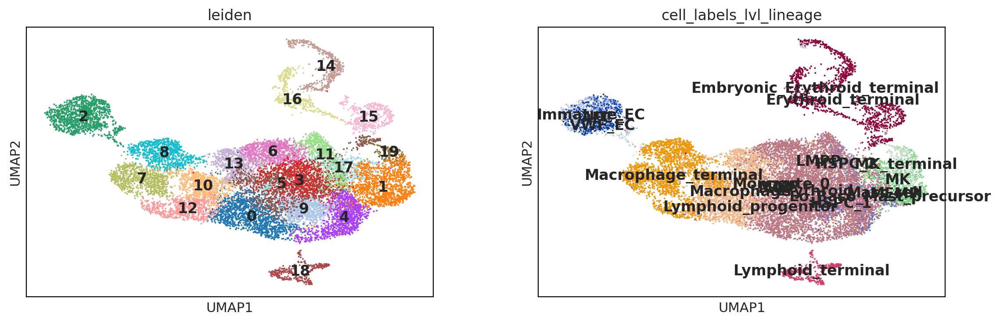

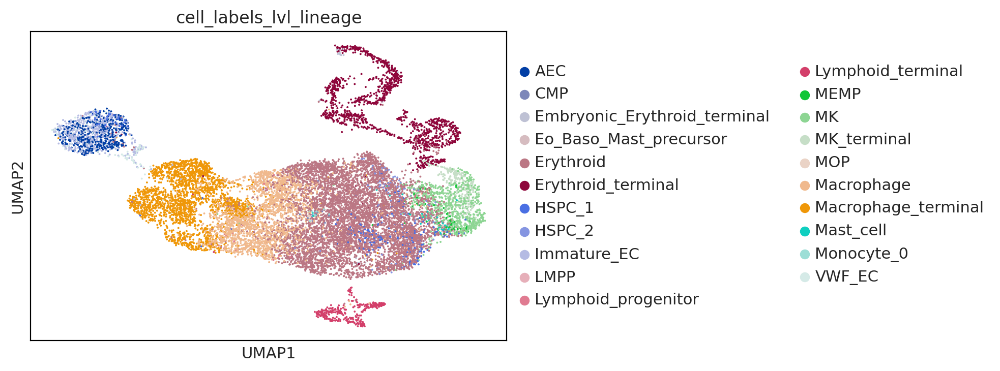

In [33]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=15,use_rep = 'X_scvi',copy=False)
sc.tl.leiden(adata)
sc.tl.umap(adata)
# sc.tl.draw_graph(adata, layout='fa')
# # sc.tl.leiden(adata, resolution=1)
sc.tl.leiden(adata)
sc.pl.umap(adata,color = ['leiden','cell_labels_lvl_lineage'],legend_loc = 'on data')
sc.pl.umap(adata,color = 'cell_labels_lvl_lineage')

In [34]:
# adata = adata[~adata.obs['leiden'].isin(['12'])]

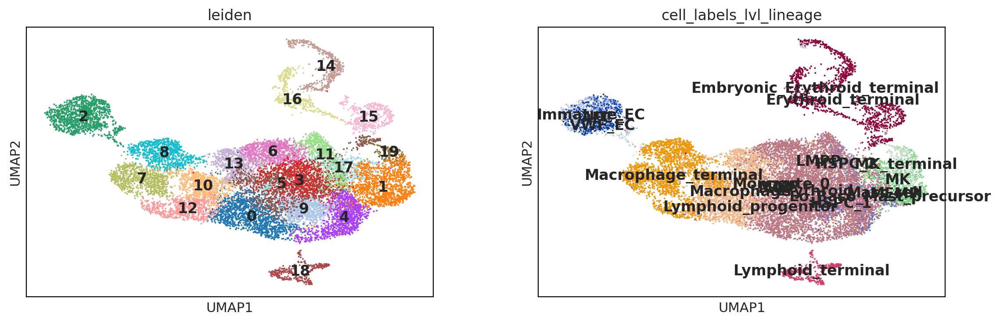

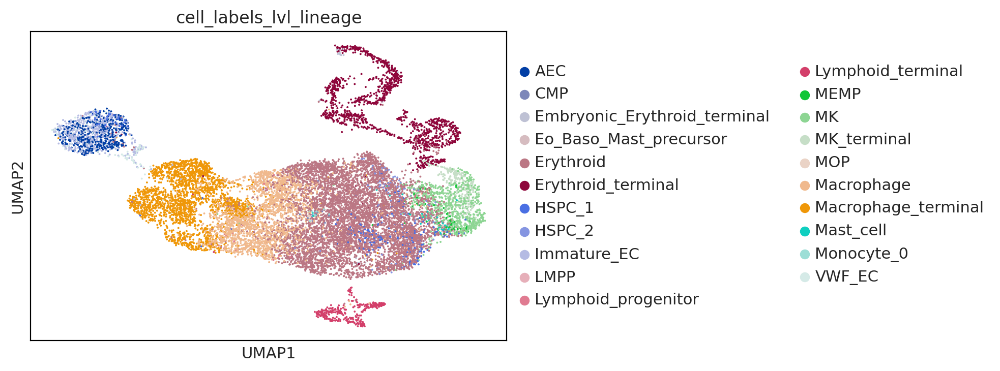

In [38]:
sc.pl.umap(adata,color = ['leiden','cell_labels_lvl_lineage'],legend_loc = 'on data')
sc.pl.umap(adata,color = 'cell_labels_lvl_lineage')

This detected 10000 highly variable genes. 
Normalized count data: X.
computing moments based on connectivities
    finished (0:00:08) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Computing CytoTRACE score with `10000` genes
Adding `adata.obs['ct_score']`
       `adata.obs['ct_pseudotime']`
       `adata.obs['ct_num_exp_genes']`
       `adata.var['ct_gene_corr']`
       `adata.var['ct_correlates']`
       `adata.uns['ct_params']`
    Finish (0:00:02)
Computing transition matrix based on `ct_pseudotime`



    Finish (0:00:10)
Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:06)


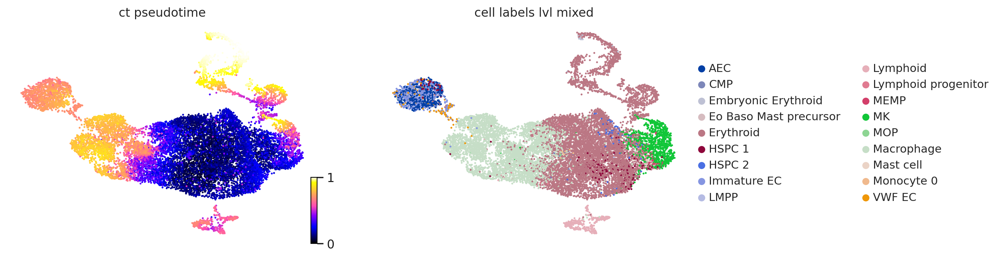

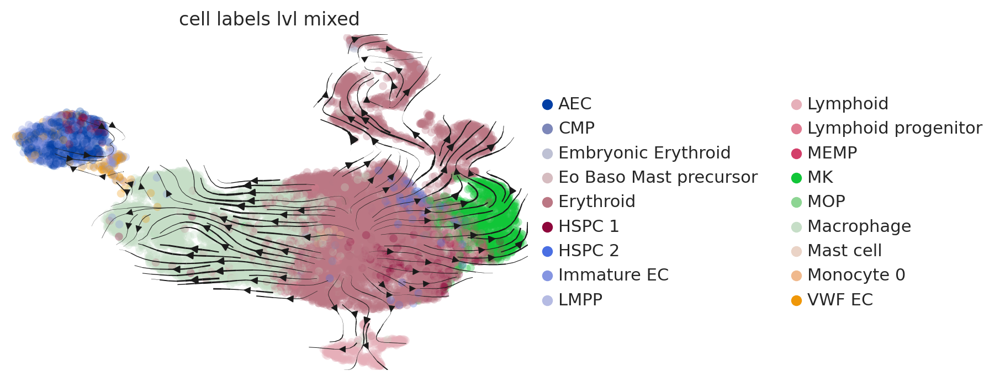

In [39]:
adata.var['highly_variable']=True

print(f"This detected {np.sum(adata.var['highly_variable'])} highly variable genes. ")
# use scVelo's `moments` function for imputation - note that hack we're using here:
# we're copying our `.X` matrix into the layers because that's where `scv.tl.moments`
# expects to find counts for imputation
adata.layers["spliced"] = adata.X
adata.layers["unspliced"] = adata.X
scv.pp.moments(adata, n_pcs=20, n_neighbors=20,use_rep='X_scvi')

##########################################################################

from cellrank.tl.kernels import CytoTRACEKernel
ctk = CytoTRACEKernel(adata)
ctk.compute_transition_matrix(threshold_scheme="soft", nu=0.5)
ctk.compute_projection(basis="umap")

scv.pl.scatter(
adata,
c=["ct_pseudotime","cell_labels_lvl_mixed"],
basis="umap",
legend_loc="right",
color_map="gnuplot2"
)
scv.pl.velocity_embedding_stream(
adata, color="cell_labels_lvl_mixed", vkey="T_fwd", basis="umap", legend_loc="right"
)

GPCCA[n=15032, kernel=<CytoTRACEKernel[dnorm=False, scheme=soft, b=10.0, nu=0.5]>]
Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000091e+00 -5.7752946504688015e-04 7.6416939653010832e-04 -1.6078033351794868e-04 4.9950058196744803e-04 -4.5849502479754179e-04 5.2777593643772366e-03 1.6655986790312205e-03 -1.5279524527133496e-03 2.2831109455749396e-03 1.2351660814059634e-02 -1.3115694546199354e-02 -1.2293199679787042e-02 -1.6457229115005603e-02 -4.5950718429671406e-03 
0.0000000000000000e+00 9.9963213832146458e-01 -1.8871641987606939e-04 -2.4305014228429339e-06 -2.2629413431350356e-05 -1.2900567589493779e-03 -3.7743868891841666e-03 2.4127054595080087e-03 -4.7032562881182639e-03 -2.4774383413779652e-03 -4.8402686624004669e-03 8.8893436773286229e-03 1.1894050543980655e-02 -3.8164645400327548e-04 -2.1666751809603793e-03 
0.0000000000000000e+00 0.0000000000000000e+00 9.9951990472249119e-01 1.4567534633461046e-04 -7.3055687597023238e-04 -6.8712406267660

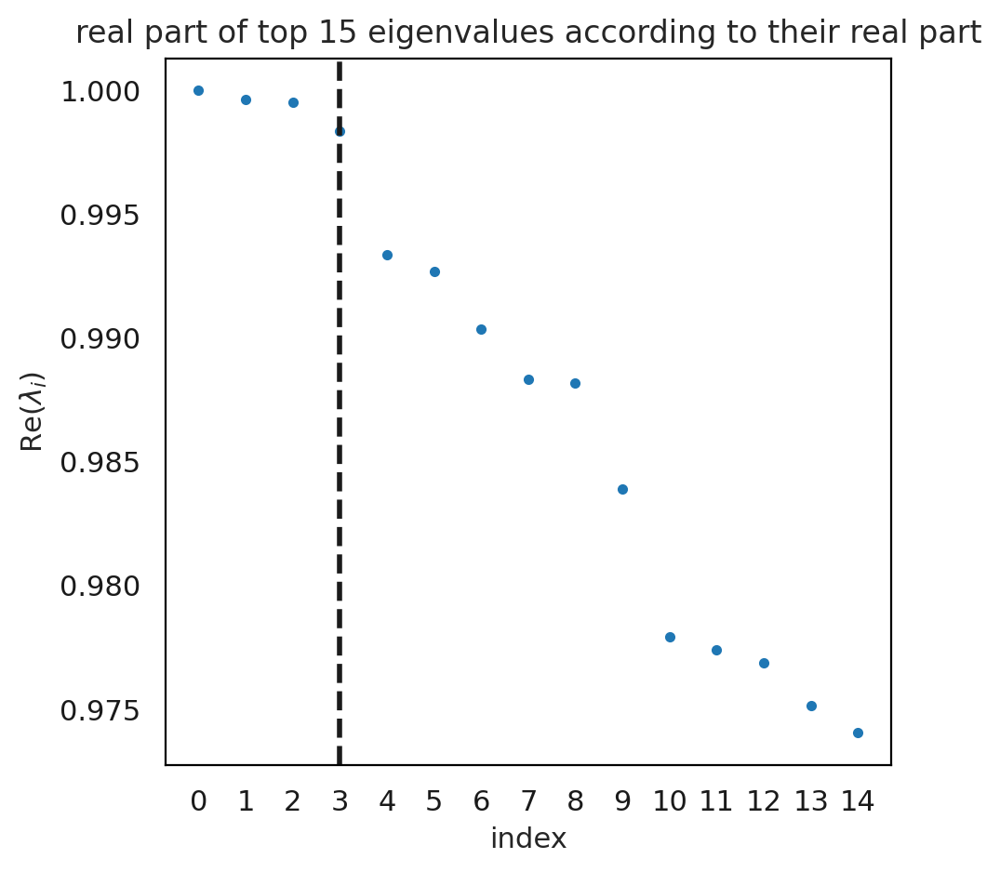

In [41]:
from cellrank.tl.estimators import GPCCA
g_fwd = GPCCA(ctk)
print(g_fwd)
g_fwd.compute_schur(n_components=15, method= 'krylov') #method='brandts is true schur distribution but will not scale
g_fwd.plot_spectrum(real_only=True)

# Manually set macrostates

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


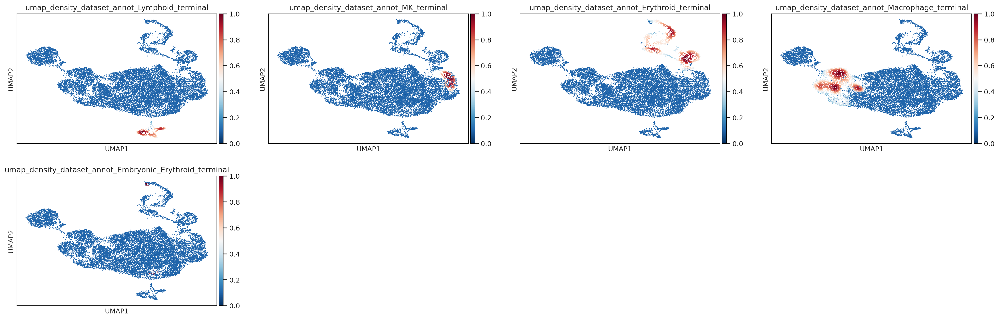

In [44]:
var_group = 'cell_labels_lvl_lineage'
sc.tl.embedding_density(adata, basis='umap', groupby=var_group, key_added='umap_density_dataset_annot')
macro = {}
state_init = [ 'Lymphoid_terminal',
 'MK_terminal', 
'Erythroid_terminal',
 'Macrophage_terminal',
 'Embryonic_Erythroid_terminal',]
densities = []
for i in state_init:
    # find KDE center of density for each state
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs[var_group].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1
    macro[i] = adata.obs.index[adata.obs.index.isin(adata.obs['umap_density_dataset_annot_'+i].nlargest(30).index)]
    densities.append('umap_density_dataset_annot_'+i)
    macro[i] = adata[adata.obs["cell_labels_lvl_lineage"] == i].obs_names
g_fwd.set_terminal_states(macro)
sc.pl.umap(adata,color = densities)

In [45]:
adata.obs['cell_labels_lvl_lineage'] = adata.obs['cell_labels_lvl_lineage'].str.replace('_1','')
adata.obs['cell_labels_lvl_lineage'] = adata.obs['cell_labels_lvl_lineage'].str.replace('_2','')

In [54]:
adata_orig = adata.copy()

In [55]:
#adata = adata_orig.copy()

In [56]:
g_fwd_orig = g_fwd.copy()
adata_pre_split = adata.copy()

In [57]:
# g_fwd = g_fwd_orig.copy()
#adata = adata_pre_split.copy()

In [58]:
adata.obs.groupby(['cell_labels_lvl_lineage']).apply(len)

cell_labels_lvl_lineage
AEC                              475
CMP                               19
Embryonic_Erythroid_terminal      33
Eo_Baso_Mast_precursor            17
Erythroid                       6111
Erythroid_terminal              1297
HSPC                             371
Immature_EC                      581
LMPP                               5
Lymphoid_progenitor               29
Lymphoid_terminal                344
MEMP                              67
MK                               742
MK_terminal                      308
MOP                                8
Macrophage                      2140
Macrophage_terminal             2300
Mast_cell                         43
Monocyte_0                        15
VWF_EC                           127
dtype: int64

In [59]:
map_state = ['HSPC']

####################

# Compute KDE for pim HSPC
sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
for i in map_state:
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1

# map_state = ['Progenitor']

# ####################

# # Compute KDE for pim HSPC
# sc.tl.embedding_density(adata, basis='umap', groupby='broad_cell.labels', key_added='umap_density_dataset_annot', components=None)
# for i in map_state:
#     adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
#     adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1

### Informally, given a (finite, discrete) Markov chain with a set of transient states  and a set of absorbing states , the absorption probability for cell  from  to reach cell  from  is the probability that a random walk initialized in  ### will reach absorbing state .

### In our context, states correspond to cells, in particular, absorbing states correspond to cells in terminal states.

In [78]:
#adata.obsm['to_terminal_states'] = g_fwd.absorption_probabilities

Computing absorption probabilities
Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:52)


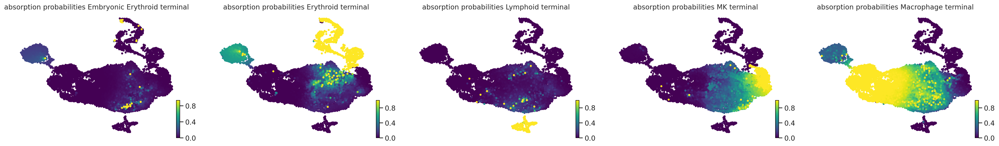

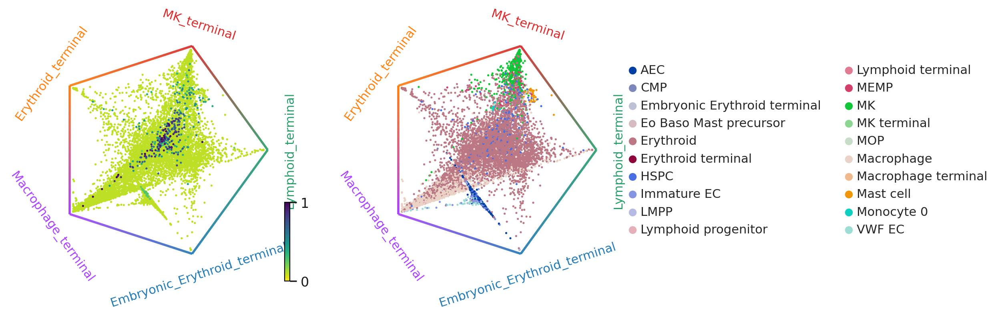

In [61]:
# states = states_inc 
# g_fwd.compute_macrostates(n_states=10, cluster_key="cell_labels_lvl_lineage")
# g_fwd.set_terminal_states_from_macrostates(names=states)
g_fwd.compute_absorption_probabilities(solver='direct')#solver='direct'
g_fwd.plot_absorption_probabilities(same_plot=False, size=50, basis="umap")
adata.obsm['to_terminal_states'] = g_fwd.absorption_probabilities
#cr.pl.circular_projection(adata, keys=["cell_sets", "cell_labels_lvl3"], early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC_1'},lineages = state_init,legend_loc="right", title="")
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_HSPC',"cell_labels_lvl_lineage"], lineages = state_init,legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'ipsc_1' )

In [65]:
adata = adata[~adata.obs['cell_labels_lvl_lineage'].isin(['Macrophage_terminal',
 'MK_terminal',
 'Lymphoid_terminal',
 'Erythroid_terminal','Embryonic_Erythroid_terminal'])]

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


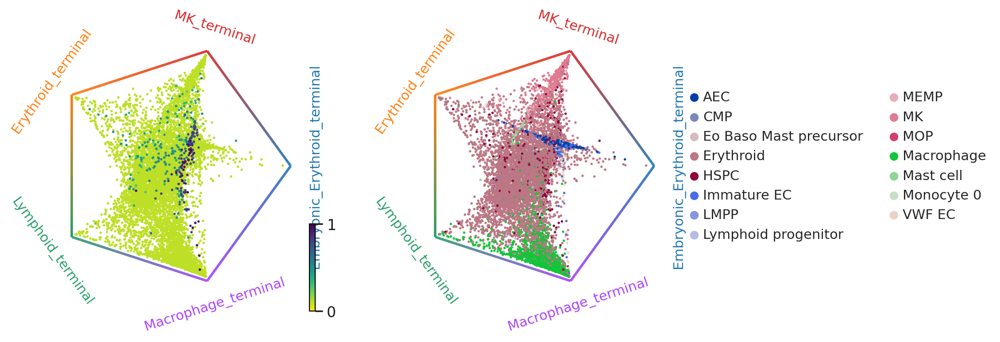

In [66]:
state_init = [
'Embryonic_Erythroid_terminal',
'MK_terminal',
'Erythroid_terminal',
#'Embryonic_Erythroid_terminal',
'Lymphoid_terminal',
'Macrophage_terminal',
]
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_HSPC', "cell_labels_lvl_lineage"], lineages = state_init,legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'ipsc_HM' )

In [67]:
g_fwd.write('./IPSC_HM_HSPC_lineage_priming_potentials', write_adata=True, ext='pickle')
#cr.tl.estimators.GPCCA.read
# adata_test = cr.tl.estimators.GPCCA.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_030522_notebooks/Submission_figure_scripts/F3/HSPC_comparison_dotplots/transition_state_prob_overtime_YS/pre_AGM_YS_HSPC_lineage_priming_potentials.pickle')
# adata_test.adata

Writing `GPCCA[n=15032, kernel=<CytoTRACEKernel[dnorm=False, scheme=soft, b=10.0, nu=0.5]>]` to `./IPSC_HM_HSPC_lineage_priming_potentials.pickle`


/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
g_fwd = cr.tl.estimators.GPCCA.read('./IPSC_HM_HSPC_lineage_priming_potentials.pickle')
adata = g_fwd.adata.copy()
dat = 'hm_ipsc'
pd.DataFrame(adata.obsm['to_terminal_states'],index = adata.obs.index,columns = adata.obsm['to_terminal_states'].names).to_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_030522_notebooks/Submission_figure_scripts/ys_mac_trajectory/embeddings/'+dat+'.csv')

In [ ]:
adata.obs['cell_labels_lvl_lineage'].unique()

In [ ]:
adata.obs.loc[adata.obs['cell_labels_lvl_lineage'].isin([i]),'umap_density_dataset_annot_HSPC'] = 0.7

In [70]:
max(adata.obs.loc[adata.obs['cell_labels_lvl_lineage'].isin([i]),'umap_density_dataset_annot_HSPC']*200)

140.0

In [72]:
map_state = ['HSPC']

####################

# Compute KDE for pim HSPC
sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
for i in map_state:
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1

# map_state = ['Progenitor']

# ####################

# # Compute KDE for pim HSPC
# sc.tl.embedding_density(adata, basis='umap', groupby='broad_cell.labels', key_added='umap_density_dataset_annot', components=None)
# for i in map_state:
#     adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
#     adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1

In [73]:
adata.obs

,cell.labels,stage,lanes,sex,sort.ids,fetal.ids,component,broad_cell.labels,sequencing.type,orig.dataset,...,ct_score,ct_pseudotime,umap_density_dataset_annot,umap_density_dataset_annot_Lymphoid_terminal,umap_density_dataset_annot_MK_terminal,umap_density_dataset_annot_Erythroid_terminal,umap_density_dataset_annot_Macrophage_terminal,umap_density_dataset_annot_Embryonic_Erythroid_terminal,terminal_states,umap_density_dataset_annot_HSPC
AAACCCAAGGATACGC-2-0-1,Erythroid_ipsc_HL,ipsc,NaN,NaN,Total,ipsc_A,NaN,NaN,3prime,H_M,...,0.849784,0.150216,0.747937,0.1,0.1,0.1,0.1,0.1,NaN,0.1
AAACCCACAATTCACG-2-0-1,Erythroid_ipsc_HL,ipsc,NaN,NaN,Total,ipsc_A,NaN,NaN,3prime,H_M,...,0.836586,0.163414,0.609950,0.1,0.1,0.1,0.1,0.1,NaN,0.1
AAACCCATCCCTCGAT-2-0-1,Macrophage_ipsc_HL,ipsc,NaN,NaN,Total,ipsc_A,NaN,NaN,3prime,H_M,...,0.671336,0.328664,0.500848,0.1,0.1,0.1,0.1,0.1,NaN,0.1
AAACGAAGTACTGACT-2-0-1,Mast_cell_ipsc_HL,ipsc,NaN,NaN,Total,ipsc_A,NaN,NaN,3prime,H_M,...,0.668132,0.331868,1.000000,0.1,0.1,0.1,0.1,0.1,NaN,0.1
AAACGCTAGAGGCGTT-2-0-1,Erythroid_ipsc_HL,ipsc,NaN,NaN,Total,ipsc_A,NaN,NaN,3prime,H_M,...,0.967143,0.032857,0.972271,0.1,0.1,0.1,0.1,0.1,NaN,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCGATGTGATACTC-3-1-1,Erythroid_ipsc_HL,ipsc,NaN,NaN,Total,ipsc_B,NaN,NaN,3prime,H_M,...,0.782254,0.217746,0.435519,0.1,0.1,0.1,0.1,0.1,NaN,0.1
TTTGGTTCAGCAGTAG-3-1-1,Erythroid_ipsc_HL,ipsc,NaN,NaN,Total,ipsc_B,NaN,NaN,3prime,H_M,...,0.795912,0.204088,0.783616,0.1,0.1,0.1,0.1,0.1,NaN,0.1
TTTGGTTGTTCATCGA-3-1-1,Immature_EC_ipsc_HL,ipsc,NaN,NaN,Total,ipsc_B,NaN,NaN,3prime,H_M,...,0.285525,0.714475,0.629764,0.1,0.1,0.1,0.1,0.1,NaN,0.1
TTTGGTTTCAGCGGAA-3-1-1,Erythroid_ipsc_HL,ipsc,NaN,NaN,Total,ipsc_B,NaN,NaN,3prime,H_M,...,0.875673,0.124327,0.695475,0.1,0.1,0.1,0.1,0.1,NaN,0.1


In [74]:
adata.obs['cell_labels_lvl_lineage'].isin(['Macrophage']),''

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(AAACCCAAGGATACGC-2-0-1    False
 AAACCCACAATTCACG-2-0-1    False
 AAACCCATCCCTCGAT-2-0-1     True
 AAACGAAGTACTGACT-2-0-1    False
 AAACGCTAGAGGCGTT-2-0-1    False
                           ...  
 TTTCGATGTGATACTC-3-1-1    False
 TTTGGTTCAGCAGTAG-3-1-1    False
 TTTGGTTGTTCATCGA-3-1-1    False
 TTTGGTTTCAGCGGAA-3-1-1    False
 TTTGTTGTCCCTCGTA-3-1-1    False
 Name: cell_labels_lvl_lineage, Length: 10750, dtype: bool,
 '')

In [75]:
# Compute KDE for pim HSPC
sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
for i in map_state:
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1

# add lymphoid probs

In [91]:
macs = pd.DataFrame(adata.obsm['to_terminal_states']['Lymphoid_terminal'],index = adata.obs.index)
macs = macs.iloc[:,0].nlargest(5000)
indexer = adata.obs[(adata.obs['cell_labels_lvl_lineage'].isin(['HSPC'])) & (adata.obs.index.isin(macs.index))].index
adata.obs.loc[adata.obs.index.isin(indexer),'umap_density_dataset_annot_HSPC'] = 0.5

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [103]:
# state_init = [
# 'Embryonic_Erythroid_terminal',
# 'MK_terminal',
# 'Erythroid_terminal',
# #'Embryonic_Erythroid_terminal',
# 'Lymphoid_terminal',
# 'Macrophage_terminal',
# ]

state_init = [ 'Lymphoid_terminal',
 'MK_terminal', 
'Erythroid_terminal',
 'Macrophage_terminal',
 'Embryonic_Erythroid_terminal',]

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [104]:
# state_init = [
# 'Embryonic_Erythroid_terminal',
# 'Macrophage_terminal',

# 'Erythroid_terminal',
# #'Embryonic_Erythroid_terminal',
# 'Lymphoid_terminal',
# 'MK_terminal',
# ]
# state_init = [ 'Lymphoid_terminal',
#  'MK_terminal', 
# 'Erythroid_terminal',
#  'Macrophage_terminal',
#  'Embryonic_Erythroid_terminal',]

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


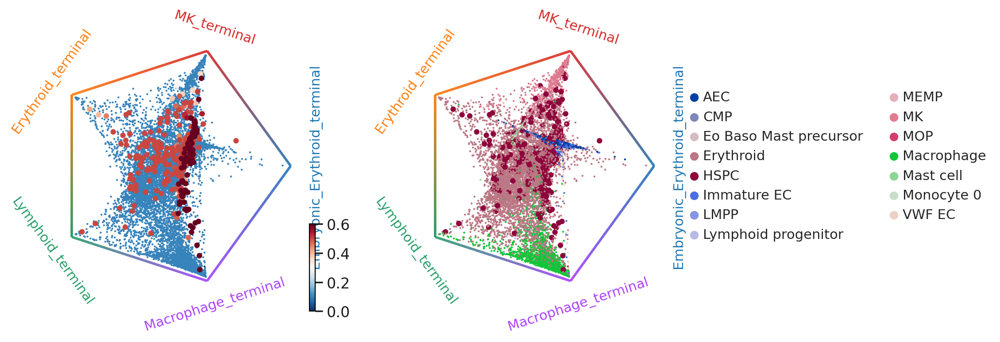

In [110]:
map_state = ['HSPC']
adata.obs['sizes'] =  10
for i in map_state:
    density_cutoff = 0.3
#     adata.obs.loc[adata.obs['umap_density_dataset_annot_HSPC']<density_cutoff,'umap_density_dataset_annot_HSPC'] = 0.1
#     adata.obs.loc[adata.obs['umap_density_dataset_annot_HSPC']>density_cutoff,'umap_density_dataset_annot_HSPC'] = 0.7
    
    adata.obs.loc[adata.obs['umap_density_dataset_annot_HSPC']>=density_cutoff,'sizes'] = 80#(adata.obs.loc[adata.obs['umap_density_dataset_annot_HSPC']>density_cutoff,'umap_density_dataset_annot_HSPC']*200).round(0)
#     adata.obs.loc[adata.obs['cell_labels_lvl_lineage'].isin([i]),'sizes'] = (adata.obs.loc[adata.obs['cell_labels_lvl_lineage'].isin([i]),'umap_density_dataset_annot_PRIM_HSPC']*100).round(0)
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_HSPC', "cell_labels_lvl_lineage"], lineages = state_init,legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'HM_ipsc_prim_V1.pdf',cmap = 'RdBu_r' ,size = np.array(adata.obs['sizes']),vmax = 0.6,vmin = 0)

In [107]:
# state_init = [
# 'Embryonic_Erythroid_terminal',
# 'MK_terminal',
# 'Erythroid_terminal',
# #'Embryonic_Erythroid_terminal',
# 'Lymphoid_terminal',
# 'Macrophage_terminal',
# ]

state_init = [
'Embryonic_Erythroid_terminal',
'MK_terminal',
'Erythroid_terminal',
#'Embryonic_Erythroid_terminal',
'Lymphoid_terminal',
'Macrophage_terminal',
]

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


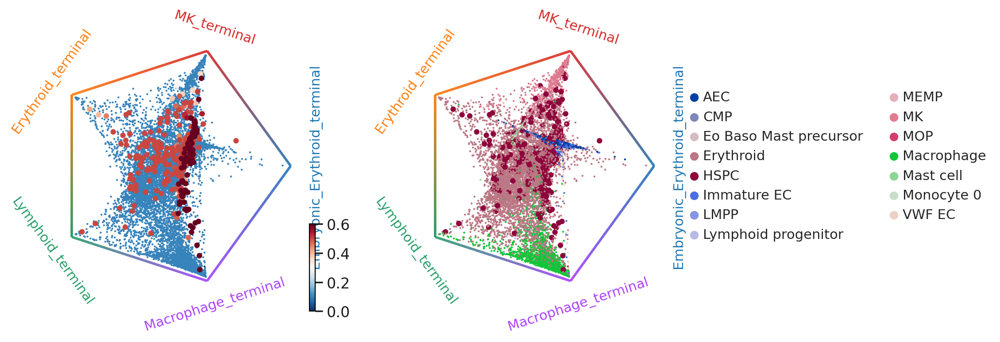

In [109]:
map_state = ['HSPC']
adata.obs['sizes'] =  10
for i in map_state:
    density_cutoff = 0.3
#     adata.obs.loc[adata.obs['umap_density_dataset_annot_HSPC']<density_cutoff,'umap_density_dataset_annot_HSPC'] = 0.1
#     adata.obs.loc[adata.obs['umap_density_dataset_annot_HSPC']>density_cutoff,'umap_density_dataset_annot_HSPC'] = 0.7
    
    adata.obs.loc[adata.obs['umap_density_dataset_annot_HSPC']>=density_cutoff,'sizes'] = 80#(adata.obs.loc[adata.obs['umap_density_dataset_annot_HSPC']>density_cutoff,'umap_density_dataset_annot_HSPC']*200).round(0)
#     adata.obs.loc[adata.obs['cell_labels_lvl_lineage'].isin([i]),'sizes'] = (adata.obs.loc[adata.obs['cell_labels_lvl_lineage'].isin([i]),'umap_density_dataset_annot_PRIM_HSPC']*100).round(0)
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_HSPC', "cell_labels_lvl_lineage"], lineages = state_init,legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'HM_ipsc_prim_V2.pdf',cmap = 'RdBu_r' ,size = np.array(adata.obs['sizes']),vmax = 0.6,vmin = 0)

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


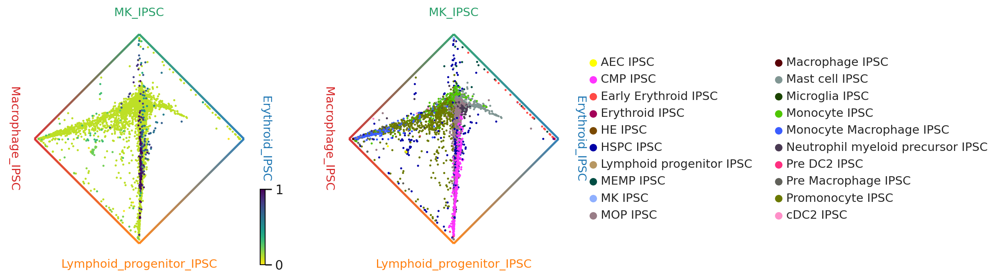

In [80]:
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_HSPC_IPSC', "cell_labels_lvl_lineage"], lineages = state_init,legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'HSPC_ipsc'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'ipsc_1' )

In [81]:
g_fwd.write('./IPSC_clara_HSPC_lineage_priming_potentials', write_adata=True, ext='pickle')
#cr.tl.estimators.GPCCA.read
# adata_test = cr.tl.estimators.GPCCA.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_030522_notebooks/Submission_figure_scripts/F3/HSPC_comparison_dotplots/transition_state_prob_overtime_YS/pre_AGM_YS_HSPC_lineage_priming_potentials.pickle')
# adata_test.adata

Writing `GPCCA[n=10932, kernel=<CytoTRACEKernel[dnorm=False, scheme=soft, b=10.0, nu=0.5]>]` to `./IPSC_clara_HSPC_lineage_priming_potentials.pickle`


/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Solving TSP for `8` states


/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


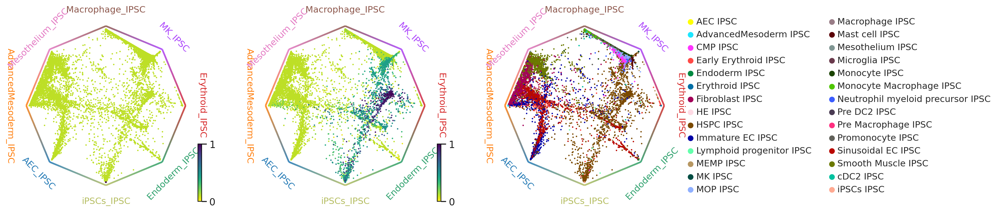

In [192]:
cr.pl.circular_projection(adata, keys=[ 'umap_density_dataset_annot_iPSCs_IPSC','umap_density_dataset_annot_HSPC_IPSC',"cell_labels_lvl_lineage"], lineages = state_init,legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'HSPC_ipsc'}, lineage_order='optimal', metric='correlation', normalize_by_mean=True,save = 'ipsc_1' )

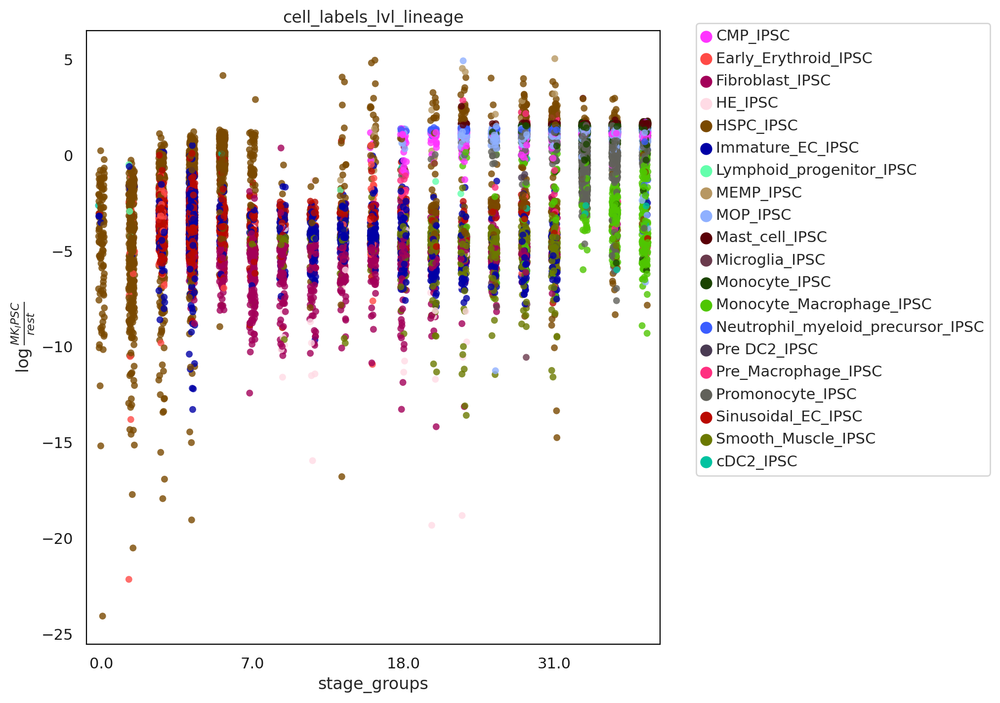

In [195]:
cr.pl.log_odds(
    adata,
    lineage_1="iPSCs_IPSC",
    lineage_2=None,
    time_key="stage_groups",
    keys=["cell_labels_lvl_lineage"],
    threshold=0,
    size=5,
    xticks_step_size=5,
    figsize=(10, 7),
    legend_loc="upper right out",
)

In [ ]:
term_state_probs = g_fwd.absorption_probabilities.copy()

In [ ]:
adata.obsm['to_terminal_states'] = g_fwd.absorption_probabilities

In [86]:
#adata.obs.groupby(['broad_cell.labels','cell_labels_lvl_mixed']).apply(len)

In [ ]:
# remove DEF
adata = adata[~adata.obs['cell_labels_lvl_lineage'].isin(['DEF_HSPC'])]

map_state = ['PRIM_HSPC','DEF_HSPC']
stage = 'CS10_11' #'CS10_11'
organ = ['YS']

adata = adata_orig.copy()
adata.obsm['to_terminal_states'] = g_fwd.absorption_probabilities

#####################

# Compute KDE for pim HSPC
sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
for i in map_state:
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1
    
map_state = ['Progenitor']

####################

# Compute KDE for prim HSPC
sc.tl.embedding_density(adata, basis='umap', groupby='broad_cell.labels', key_added='umap_density_dataset_annot', components=None)
for i in map_state:
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs['broad_cell.labels'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1    
    
    
#####################
# manually set lymphoid potential to low
names = ['Lymphoid'] #'Mast_cell',
for name in names:
    adata.obs[name] = g_fwd.absorption_probabilities.X[:,list(g_fwd.absorption_probabilities.names).index(name)]


# Slice to only contain age group
keep = list(adata.obs.index[adata.obs['stage_groups'].isin([stage])])
# keep.append(list(adata.obs.index[adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid'])]))
adata = adata[adata.obs.index.isin(keep)]
adata = adata[adata.obs['tissue'].isin(organ)]

#####################
for name in names:
    rm_lymph = adata.obs[name].nlargest(20).index
    adata = adata[~adata.obs.index.isin(rm_lymph)]


cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC','umap_density_dataset_annot_Progenitor','umap_density_dataset_annot', "cell_labels_lvl_lineage"], lineages = state_init,legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = stage,cmap = 'RdBu_r' ,size = 10)

In [ ]:
adata.obs['stage_float'] = adata.obs['stage'].str.replace('CS','')

In [ ]:
adata.obs['stage_float']

In [ ]:
cr.pl.log_odds(
    adata,
    lineage_1="Lymphoid",
    lineage_2="MK",
    time_key="stage_float",
    keys=["umap_density_dataset_annot_PRIM_HSPC"],
    threshold=0,
    size=2,
    xticks_step_size=4,
    figsize=(9, 4),
    legend_loc="upper right out",
)

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


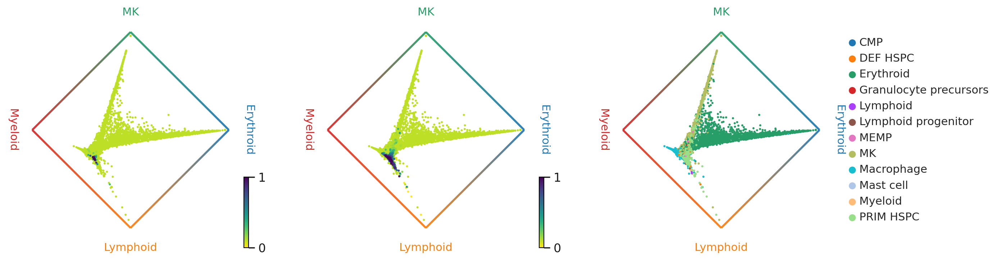

In [130]:
map_state = ['PRIM_HSPC','DEF_HSPC']
stage = 'CS10_11' #'CS10_11'
organ = ['YS']

adata = adata_orig.copy()
adata.obsm['to_terminal_states'] = g_fwd.absorption_probabilities

#####################

# Compute KDE for pim HSPC
sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
for i in map_state:
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1
    
#####################

# Slice to only contain age group
keep = list(adata.obs.index[adata.obs['stage_groups'].isin([stage])])
# keep.append(list(adata.obs.index[adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid'])]))
adata = adata[adata.obs.index.isin(keep)]
adata = adata[adata.obs['tissue'].isin(organ)]

#####################
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC', "cell_labels_lvl_lineage"], lineages = state_init,legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = stage )

In [274]:
adata.obs.iloc[0:10196]

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,cell.labels,stage,lanes,sex,sort.ids,fetal.ids,component,broad_cell.labels,sequencing.type,orig.dataset,...,umap_density_dataset_annot,umap_density_dataset_annot_Erythroid,umap_density_dataset_annot_MK,umap_density_dataset_annot_Myeloid,umap_density_dataset_annot_Mast_cell,umap_density_dataset_annot_Lymphoid,terminal_states,umap_density_dataset_annot_PRIM_HSPC,umap_density_dataset_annot_DEF_HSPC,umap_density_dataset_annot_Progenitor
Wang_et_al_AAACCTGCACTTAAGC_1-0,HSPC_1,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Progenitor,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.791689,0.100000,0.100000,0.100000,0.1,0.1,NaN,0.537274,0.1,0.791689
Wang_et_al_AAACCTGGTAACGACG_1-0,Erythroid,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Erythroid,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.996851,0.996851,0.100000,0.100000,0.1,0.1,Erythroid,0.100000,0.1,0.100000
Wang_et_al_AAACCTGGTCAAAGAT_1-0,Erythroid,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Erythroid,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.546381,0.546381,0.100000,0.100000,0.1,0.1,NaN,0.100000,0.1,0.100000
Wang_et_al_AAACCTGGTCCGAAGA_1-0,Erythroid,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Erythroid,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.533936,0.533936,0.100000,0.100000,0.1,0.1,NaN,0.100000,0.1,0.100000
Wang_et_al_AAACCTGGTCCGCTGA_1-0,Erythroid,CS10,Wang_CS10,Male,Total,Wang_CS10,Membrane,Erythroid,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.291319,0.291319,0.100000,0.100000,0.1,0.1,NaN,0.100000,0.1,0.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wang_et_al_TTTGTCAAGTACCGGA_2-0,Macrophage,CS11,Wang_CS11,Female,Total,Wang_CS11,Membrane,Macrophage,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.960987,0.100000,0.100000,0.983889,0.1,0.1,NaN,0.100000,0.1,0.100000
Wang_et_al_TTTGTCAAGTGTGAAT_2-0,MK,CS11,Wang_CS11,Female,Total,Wang_CS11,Membrane,MK,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.487306,0.100000,0.487306,0.100000,0.1,0.1,NaN,0.100000,0.1,0.100000
Wang_et_al_TTTGTCACATCGGGTC_2-0,MK,CS11,Wang_CS11,Female,Total,Wang_CS11,Membrane,MK,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.840239,0.100000,0.840239,0.100000,0.1,0.1,NaN,0.100000,0.1,0.100000
Wang_et_al_TTTGTCACATCGTCGG_2-0,MK,CS11,Wang_CS11,Female,Total,Wang_CS11,Membrane,MK,TBC,Wang_et_al_Cell_Stem Cell_2021,...,0.456337,0.100000,0.456337,0.100000,0.1,0.1,NaN,0.100000,0.1,0.100000


In [262]:
ind = np.argpartition(g_fwd.absorption_probabilities.X[:,list(g_fwd.absorption_probabilities.names).index('Lymphoid')], -30)[-30:]
ind

array([10196, 11052, 10204, 10146, 11084, 10215, 11039, 10189, 10346,
       10340, 10186, 10217, 10996, 10315, 10313, 10309, 10306, 10038,
       10172, 10293, 10168, 10063, 10203, 10069, 10273, 10225, 10265,
       10969, 10238, 10201])

In [257]:
np.min(g_fwd.absorption_probabilities.X[:,list(g_fwd.absorption_probabilities.names).index('Lymphoid')])

0.0

In [258]:
np.max(g_fwd.absorption_probabilities.X[:,list(g_fwd.absorption_probabilities.names).index('Lymphoid')])

1.0

# Lineage Class mods

Lymphoid


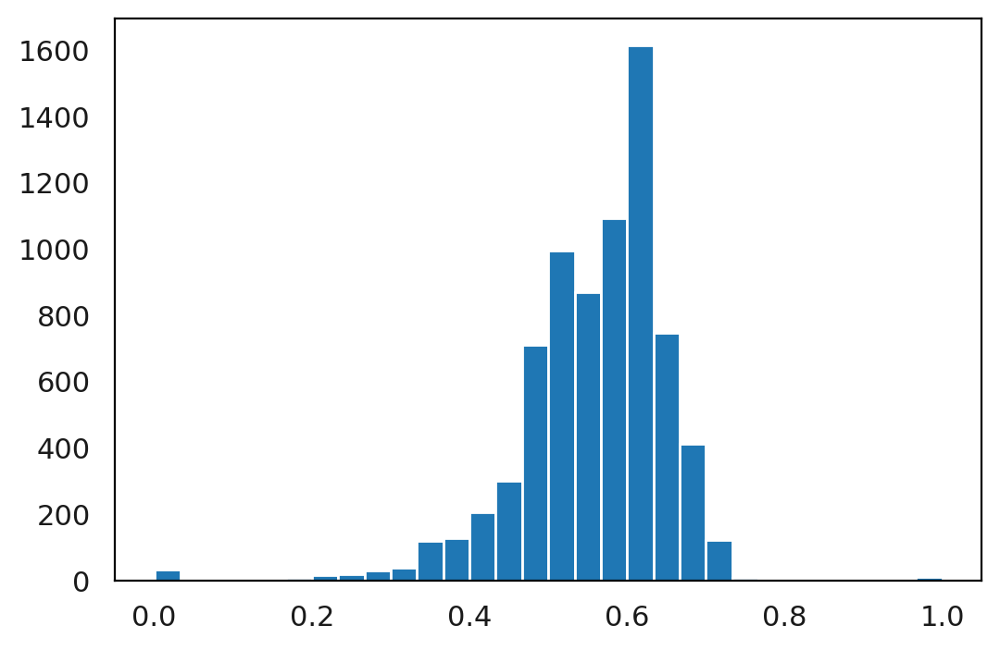

Mast_cell


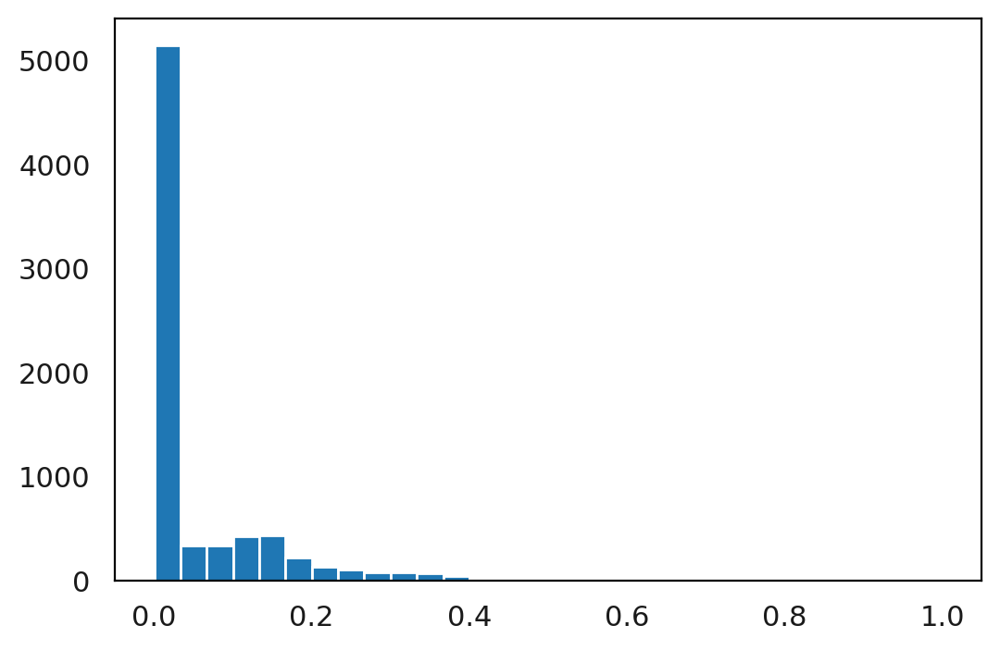

In [445]:
# Modify lineage info, set to 0
int_classes = ['Lymphoid','Mast_cell']
def cr_lineage_set_0_prob(int_classes):
    positions = []
    for class_temp in int_classes:
        pos_temp = list(g_fwd.absorption_probabilities.names).index(class_temp)
        positions.append(pos_temp)
        #g_fwd.absorption_probabilities.X[:,pos_temp] = np.zeros(len(g_fwd.absorption_probabilities))
        print(class_temp)
        plt.hist(g_fwd.absorption_probabilities.X[:,pos_temp], bins=30)
        plt.show()
cr_lineage_set_0_prob(int_classes)

In [448]:
g_fwd.absorption_probabilities.X[:,list(g_fwd.absorption_probabilities.names).index('Mast_cell')] = g_fwd.absorption_probabilities.X[:,list(g_fwd.absorption_probabilities.names).index('Lymphoid')]

In [449]:
adata.obsm['to_terminal_states'] =  g_fwd.absorption_probabilities

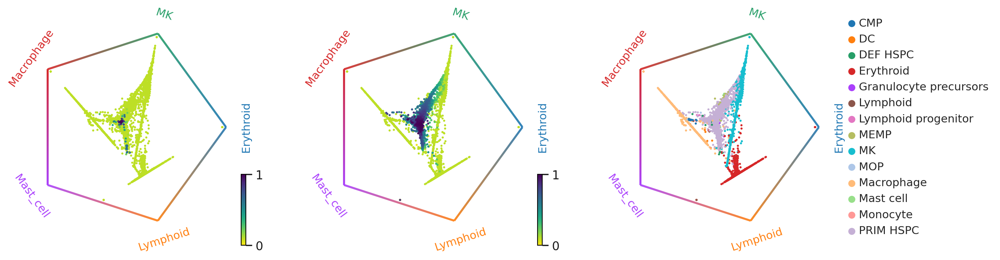

In [450]:
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC', "cell_labels_lvl_lineage"], lineages = state_init,legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = stage )

In [257]:
adata.obs.groupby(['cell_labels_lvl3']).apply(len)

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


cell_labels_lvl3
CMP                         22
DEF_HSPC_1                  41
DEF_HSPC_2                  15
Early_Erythroid            421
Eo_Baso_Mast_precursor       5
Erythroid                 1996
Lymphoid B lin               2
Lymphoid_progenitor         16
MEMP                        26
MK                        1101
MOP                          8
Macrophage                1494
Mast_cell                    4
Mid_Erythroid                1
Mono Mac pre DC2             1
Monocyte_0                   3
Monocyte_ys_1                3
NK                           1
Neutrophil_precursor         4
PRIM_HSPC_1               1800
PRIM_HSPC_2                498
Pre DC2                      4
Pre_Macrophage               2
Promonocyte                  7
dtype: int64

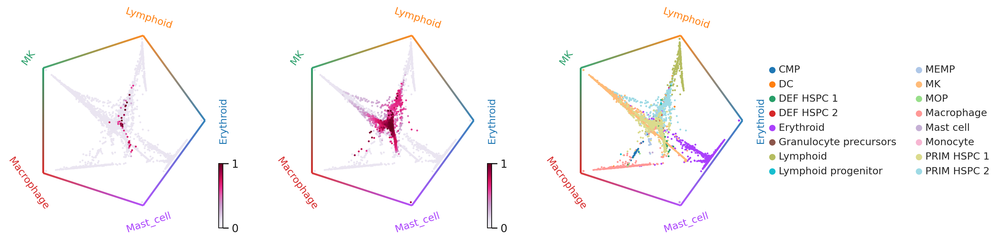

In [251]:
map_state = ['PRIM_HSPC','DEF_HSPC']

#####################

# Compute KDE for pim HSPC
sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
for i in map_state:
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1

cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC', "cell_labels_lvl_mixed"], legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC_1'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = stage,cmap = 'PuRd' )

In [252]:
to_terminal_states = adata.obsm['to_terminal_states'].copy()

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [72]:
# adata.obsm['to_terminal_states'] = to_terminal_states.copy()

# Plot only pre-AGM

In [172]:
# # Compute KDE for pim HSPC
# sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
# i = 'PRIM_HSPC'
# adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
# adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1

In [207]:
adata.obsm['to_terminal_states'].names

array(['Erythroid', 'Lymphoid', 'MK', 'Macrophage', 'Mast_cell'],
      dtype='<U10')

In [209]:
adata.obsm['to_terminal_states']

Erythroid,Lymphoid,MK,Macrophage,Mast_cell
0.995888,0.000001,0.000000,0.003382,0.000002
0.743653,0.000863,0.000016,0.251469,0.003467
0.995720,0.000001,0.000000,0.003549,0.000003
0.995915,0.000000,0.000000,0.003357,0.000001
0.995929,0.000000,0.000000,0.003344,0.000001
0.995872,0.000001,0.000000,0.003396,0.000003
0.996145,0.000001,0.000000,0.003188,0.000002
0.995930,0.000000,0.000000,0.003343,0.000001
0.995751,0.000001,0.000000,0.003518,0.000002
0.995713,0.000001,0.000000,0.003556,0.000003


In [210]:
np.zeros(len(adata.obsm['to_terminal_states']['Lymphoid']))

array([0., 0., 0., ..., 0., 0., 0.])

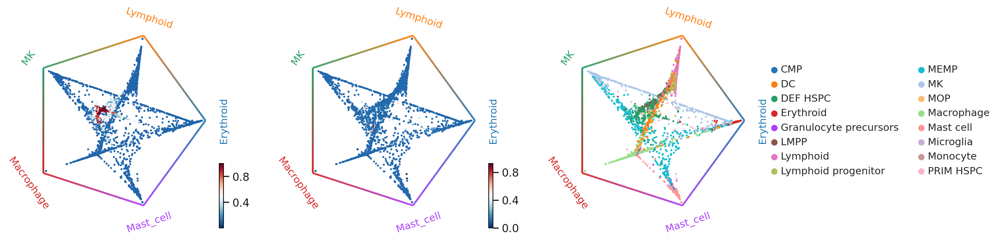

In [173]:
map_state = ['PRIM_HSPC','DEF_HSPC']
stage = 'CS17_18' #'CS10_11'

adata = adata_orig.copy()
adata.obsm['to_terminal_states'] = g_fwd.absorption_probabilities

#####################

# Compute KDE for pim HSPC
sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
for i in map_state:
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1
    
#####################

# Slice to only contain age group
keep = list(adata.obs.index[adata.obs['stage_groups'].isin([stage])])
# keep.append(list(adata.obs.index[adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid'])]))
adata = adata[adata.obs.index.isin(keep)]

#####################
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC', "cell_labels_lvl_lineage"], legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'CS17_18' )

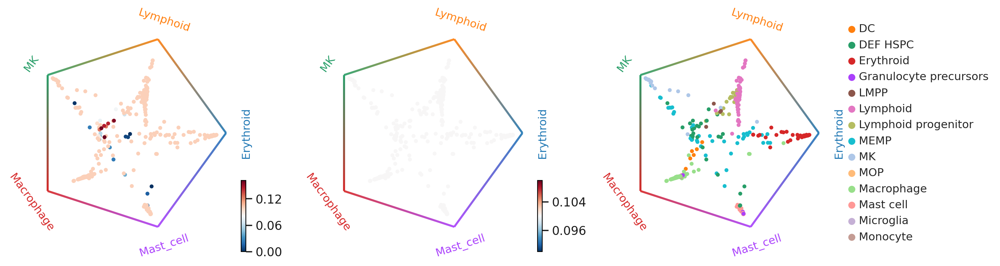

In [221]:
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC', "cell_labels_lvl_lineage"], legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'CS17_18' )

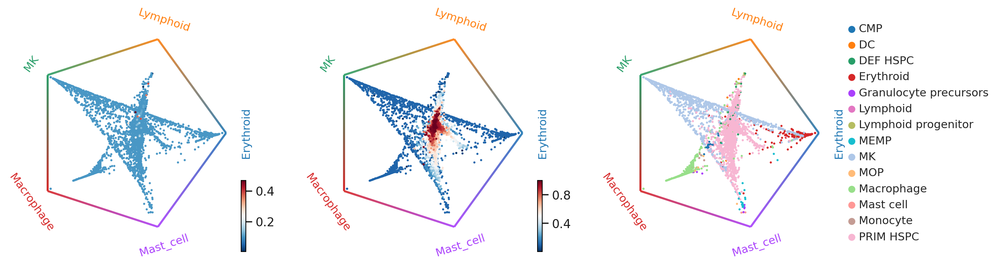

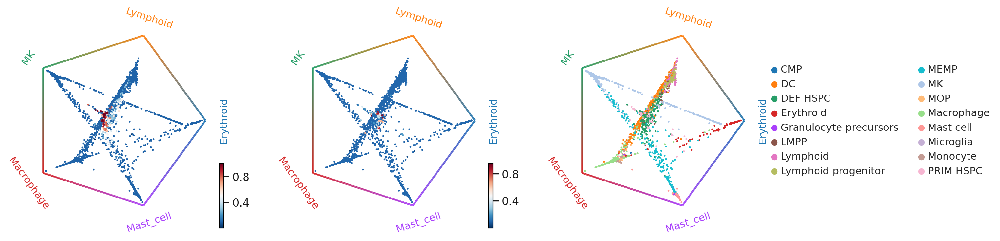

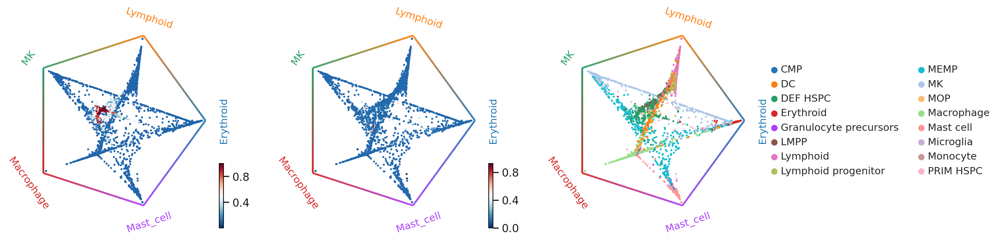

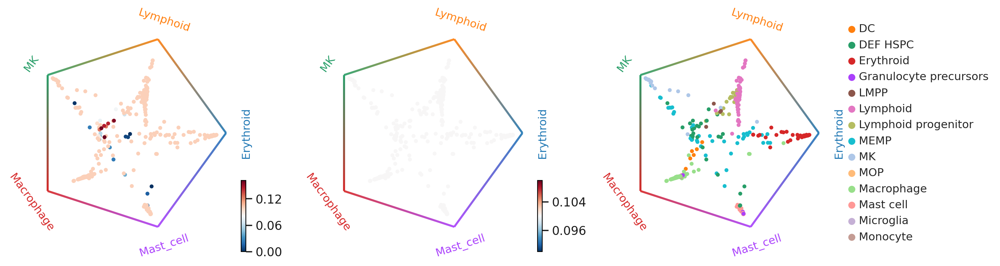

In [211]:
map_state = ['PRIM_HSPC','DEF_HSPC']
stages = ['CS10_11','CS14_15','CS17_18','CS22_23'] #'CS10_11'

for stage in stages:
    adata = adata_orig.copy()
    adata.obsm['to_terminal_states'] = g_fwd.absorption_probabilities

##########################################

    # Compute KDE for pim HSPC
    sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
    for i in map_state:
        adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
        adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1

##########################################

    # Slice to only contain age group
    keep = list(adata.obs.index[adata.obs['stage_groups'].isin([stage])])
    # keep.append(list(adata.obs.index[adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid'])]))
    adata = adata[adata.obs.index.isin(keep)]

##########################################

    cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC', "cell_labels_lvl_lineage"], legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = stage )

Computing absorption probabilities


/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:20)


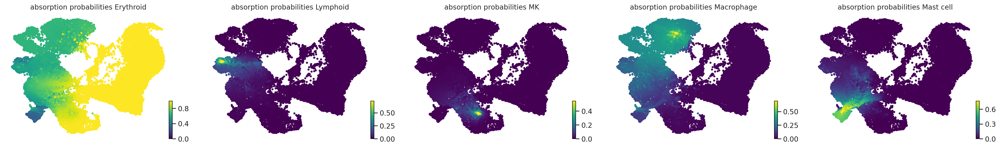

In [83]:
g_fwd.compute_absorption_probabilities()#solver='direct'
g_fwd.plot_absorption_probabilities(same_plot=False, size=50, basis="umap")

In [106]:
#adata.obsm['to_terminal_states'] = g_fwd.absorption_probabilities

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


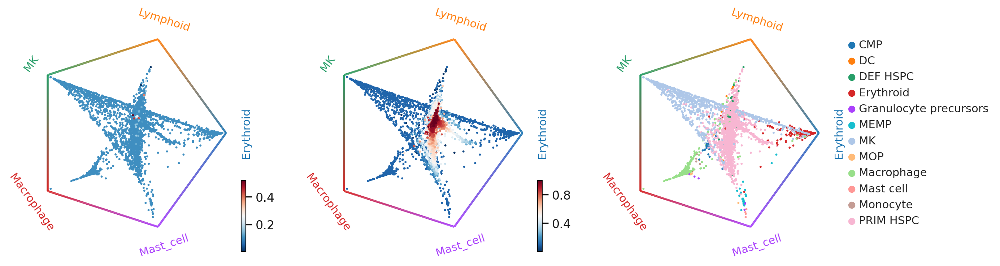

In [87]:
map_state = ['PRIM_HSPC','DEF_HSPC']
stage = 'CS10_11'

adata = adata_orig.copy()
#adata.obsm['to_terminal_states'] = to_terminal_states.copy()

# Compute KDE for pim HSPC
sc.tl.embedding_density(adata, basis='umap', groupby='cell_labels_lvl_lineage', key_added='umap_density_dataset_annot', components=None)
for i in map_state:
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_dataset_annot']
    adata.obs.loc[~adata.obs['cell_labels_lvl_lineage'].isin([i]),('umap_density_dataset_annot_'+i)] = 0.1

# Slice to only contain age group
keep = list(adata.obs.index[adata.obs['stage_groups'].isin([stage])])
adata = adata[~adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid_progenitor','Lymphoid'])]
# keep.append(list(adata.obs.index[adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid'])]))
adata = adata[adata.obs.index.isin(keep)]

cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC', "cell_labels_lvl_lineage"], legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'CS17_18' )

In [84]:
adata.obsm['to_terminal_states'] = np.array(adata.obsm['to_terminal_states'])

In [85]:
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC', "cell_labels_lvl_lineage"], legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'CS17_18' )

AttributeError: 'numpy.ndarray' object has no attribute 'names'

In [79]:
pd.DataFrame(adata.obsm['to_terminal_states'],columns = )

,0,1,2,3,4
0,0.660621,7.410933e-02,2.900173e-02,0.084501,1.517666e-01
1,0.999937,3.157101e-07,6.438743e-08,0.000063,3.507954e-07
2,0.999953,2.029954e-07,3.800986e-08,0.000047,2.199679e-07
3,0.999933,3.225336e-07,7.114313e-08,0.000067,3.628618e-07
4,0.999932,3.320656e-07,7.571444e-08,0.000067,3.688639e-07
...,...,...,...,...,...
7451,0.722596,2.924577e-03,2.222790e-05,0.271884,2.567714e-03
7452,0.892666,2.802441e-03,8.414104e-02,0.008539,1.185427e-02
7453,0.674109,2.664532e-03,2.960839e-01,0.005714,2.143074e-02
7454,0.996000,1.915409e-04,1.863464e-04,0.003498,1.291886e-04


In [75]:
adata.obsm['to_terminal_states']['Lymphoid'] = np.zeros(len(adata.obsm['to_terminal_states']['Lymphoid']))

array([0., 0., 0., ..., 0., 0., 0.])

In [47]:
'umap_density_dataset_annot_DEF_HSPC','umap_density_dataset_annot_PRIM_HSPC'

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'umap_density_dataset_annot_DEF_HSPC'

In [ ]:
cr.pl.circular_projection(adata, keys=['umap_density_dataset_annot_'+i, "cell_labels_lvl_lineage"], legend_loc="right", title="",early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True,save = 'CS17_18' )

In [39]:
# plot only progenitors below here

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [40]:
mix = [#'PRIM_HSPC_1',
 'Early_Erythroid',
# 'PRIM_HSPC_2',
 'MK',
 'Lymphoid_progenitor',
#  'DEF_HSPC_2',
 'MEMP',
#  'DEF_HSPC_1',
 'MOP',
 'CMP',
 'LMPP']
adata = adata[adata.obs['cell_labels_lvl_lineage'].isin(mix)]

In [51]:
adata

View of AnnData object with n_obs × n_vars = 762 × 5000
    obs: 'cell.labels', 'stage', 'lanes', 'sex', 'sort.ids', 'fetal.ids', 'component', 'broad_cell.labels', 'sequencing.type', 'orig.dataset', 'broad_cell_labels_organ', 'tissue', 'V6_old_indexes', 'dataset_merge', 'index_orig', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'organ', 'donor', 'new_data_handle', 'batch', 'HDBR_ID', 'leiden_scvi_res15', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet_score', 'scrublet_cluster_score', 'scr_bh_pval', 'scr_pval', 'scr_doublet_call_default', 'scrublet_leiden_R', 'cell_labels_lvl2', 'cell_labels_lvl3', 'cell_labels_lvl1', 'cell_labels_lvl_mixed', 'chemistry_ver', 'lr_batch', '_scvi_batch', '_scvi_labels', 'stage_groups', 'cell_labels_lvl_lineage', 'n_counts', 'ct_num_exp_genes', 'ct_score', 'ct_pseudotime', 'terminal_states', 'terminal_states_probs', 'to_terminal_states_entropy', 'umap_density_cell_labels_lvl_lineage', 'umap_density_dataset

In [47]:
'umap_density_dataset_annot_'+i

'umap_density_dataset_annot_Prim_HSPC'

In [32]:
cr.pl.circular_projection(adata, keys=["cell_sets", "cell_labels_lvl",'umap_density_dataset_annot_Prim_HSPC'], legend_loc="right", title="", early_cells={'cell_labels_lvl_lineage':'PRIM_HSPC'}, lineage_order='default', metric='correlation', normalize_by_mean=True, )

ValueError: No valid keys have been selected.

In [90]:
# Slice to only contain age group
stage = 'CS10_11'
keep = list(adata.obs.index[adata.obs['stage_groups'].isin([stage])])
keep.append(list(adata.obs.index[adata.obs['cell_labels_lvl_lineage'].isin(['Lymphoid'])]))
adata = adata[adata.obs.index.isin(keep)]

In [91]:
cr.pl.circular_projection(adata, keys=["cell_sets", "cell_labels_lvl3"], legend_loc="right", title="")

KeyError: "Lineages key `'to_terminal_states'` not found in `adata.obsm`."

In [153]:
g_fwd.terminal_states_memberships

MK,Lymphoid_progenitor,Erythroid_4,Macrophage_2,Mast_cell
0.001219,0.025093,0.556073,0.055171,0.001619
0.001286,0.026503,0.513722,0.062076,0.001078
0.001252,0.025449,0.253919,0.055905,0.002024
0.006590,0.247736,0.055979,0.122637,0.004692
0.001231,0.025143,0.366121,0.054806,0.001931
0.112673,0.179465,0.146276,0.029846,0.057412
0.001280,0.025601,0.565934,0.057691,0.001400
0.001247,0.025438,0.371431,0.056264,0.001803
0.003422,0.619909,0.052885,0.057298,0.002575
0.001273,0.025712,0.075125,0.056541,0.002279


In [83]:
adata = adata[adata.obs['cell_labels_lvl_lineage'].isin(['lymphoid'])]

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [84]:
keys = ["terminal_states_memberships", "cell_labels_lvl_lineage"]
cr.pl.circular_projection(adata, keys, backward=False, legend_loc="right",lineages=states, early_cells=['PRIM_HSPC'], lineage_order='default', metric='correlation', normalize_by_mean=True, ncols=4, space=0.1, use_raw=False,  label_distance=1.25, label_rot='best', show_edges=True, key_added=None, figsize=None, dpi=None, save=None )

ValueError: Expected number cells to be at least 1, found 0.

In [ ]:
cr.pl.log_odds(
    adata_temp,
    lineage_1="PRIM_HSPC",
    lineage_2=None,
    time_key="day",
    keys=["cell_sets"],
    threshold=0,
    size=2,
    xticks_step_size=4,
    figsize=(9, 4),
    legend_loc="upper right out",
)